# Rotational Motion

```{index}Rotational Motion

In [1]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML

## Tutorial Problem 4.5

Applying angular momentum theorem

In [5]:
from sympy import Symbol, integrate

F = Symbol('F') # force
M = Symbol('M') # mass of cylinder
R = Symbol('R') # distance from the centre of the cylinder to where the force is applied 
t = Symbol('t') # time

angular_acceleration = -(2*F)/(M*R)

angular_velocity = integrate(angular_acceleration, t)

angle = integrate(angular_velocity, t)

print("angular velocity = ", angular_velocity)

print("angle = ", angle)

angular velocity =  -2*F*t/(M*R)
angle =  -F*t**2/(M*R)


In [7]:
F = 10 # N
M = 10 # kg
R = 1 # m

t = np.linspace(0, 10, 500)

a_a = -(2*F)/(M*R) # angular acceleration

a_v = -2 * F * t / (M * R) # angular velocity

a = -(F * t**2) / (M * R) # angle

print("Angular acceleration = %.2f rad/s2" % (a_a))

X = R * np.cos(a) # x coordinate

Y = R * np.sin(a) # y coordinate

length = R * (-a / (2 * np.pi)) # length of string 

l = np.zeros((len(t), len(t))) # store data in matrix to make animation
for i in range(len(t)):
    for j in range(i+1):
        l[i][j] = length[j]

Angular acceleration = -2.00 rad/s2


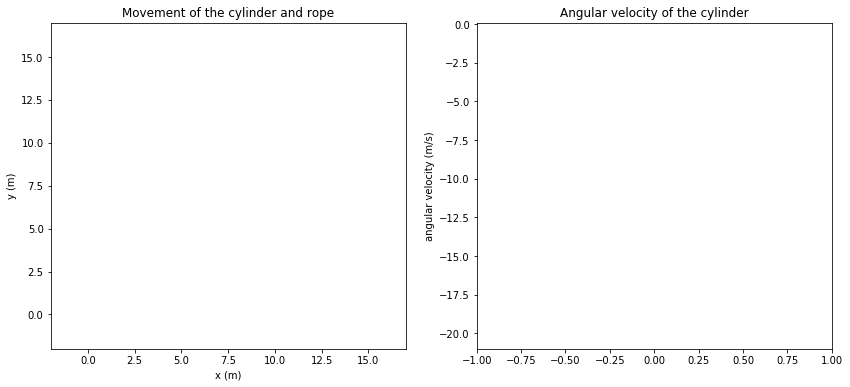

In [8]:
nframes = len(t)


# Plot background axes
fig, axes = plt.subplots(1,2, figsize=(14,6))

# define lines
line1, = axes[0].plot([], [], 'ro', lw=2)
line2, = axes[0].plot([], [], 'k', lw=0.5)
line3, = axes[0].plot([], [], 'k', lw=1)
line4, = axes[1].plot([], [], 'bo', lw=2)

# customise axes 

axes[0].set_xlim((-2, 17))
axes[0].set_ylim((-2, 17))
axes[0].set_xlabel('x (m)')
axes[0].set_ylabel('y (m)')
axes[0].set_title('Movement of the cylinder and rope')


axes[1].set_xlim((-1, 1))
axes[1].set_ylim((-21, 0.1))
axes[1].set_ylabel('angular velocity (m/s)')
axes[1].set_title('Angular velocity of the cylinder')


    
lines = [line1, line2, line3, line4]

# Plot background for each frame
def init():
    for line in lines:
        line.set_data([], [])
    return lines

# Set what data to plot in each frame
def animate(i):
    
    x1 = X[i]
    y1 = Y[i]
    lines[0].set_data(x1, y1)
    x_1 = X
    y_1 = Y
    lines[1].set_data(x_1, y_1)
    x_2 = l[i]
    y_2 = 1
    lines[2].set_data(x_2, y_2)
    
    x2 = 0
    y2 = a_v[i]
    lines[3].set_data(x2, y2)

    
    return lines

# Call the animator
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=nframes, interval=10, blit=True)

In [9]:
HTML(anim.to_jshtml())